In [1]:
import pandas as pd
import numpy as np 
import itertools
import keras
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img 
from keras.models import Sequential 
from keras import optimizers
from keras.preprocessing import image
from keras.layers import Dropout, Flatten, Dense 
from keras import applications 
from keras.utils.np_utils import to_categorical 
import matplotlib.pyplot as plt 
import matplotlib.image as mpimg
%matplotlib inline
import math 
import datetime
import time

Using TensorFlow backend.


In [2]:
import os

base_dir = r'C:\Users\user\OneDrive - 台灣智園有限公司\文件\＊WG_New_2020_May\新-浙大2020\Learner_Persona_paper\training_dataset1'
train_dir = os.path.join(base_dir, 'training_dataset')

# Directory with our training unenthusiastic teaching pictures
train_unenthusiastic_dir = os.path.join(train_dir, 'unenthusiastic')

# Directory with our training enthusiastic teaching pictures
train_enthusiastic_dir = os.path.join(train_dir, 'enthusiastic')


In [3]:
train_unenthusiastic_fnames = os.listdir(train_unenthusiastic_dir)
train_unenthusiastic_fnames.sort()
print(train_unenthusiastic_fnames[:10])

train_enthusiastic_fnames = os.listdir(train_enthusiastic_dir)
print(train_enthusiastic_fnames[:10])

print('total training unenthusiastic images:', len(os.listdir(train_unenthusiastic_dir)))
print('total training enthusiastic images:', len(os.listdir(train_enthusiastic_dir)))


['unenthusiastic (1).png', 'unenthusiastic (10).png', 'unenthusiastic (100).png', 'unenthusiastic (101).png', 'unenthusiastic (102).png', 'unenthusiastic (103).png', 'unenthusiastic (104).png', 'unenthusiastic (105).png', 'unenthusiastic (106).png', 'unenthusiastic (107).png']
['enthusiastic (1).png', 'enthusiastic (10).png', 'enthusiastic (100).png', 'enthusiastic (101).png', 'enthusiastic (102).png', 'enthusiastic (103).png', 'enthusiastic (104).png', 'enthusiastic (105).png', 'enthusiastic (106).png', 'enthusiastic (107).png']
total training unenthusiastic images: 344
total training enthusiastic images: 321


In [4]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Parameters for our graph; we'll output images in a 4x4 configuration
nrows = 4
ncols = 4

# Index for iterating over images
pic_index = 0

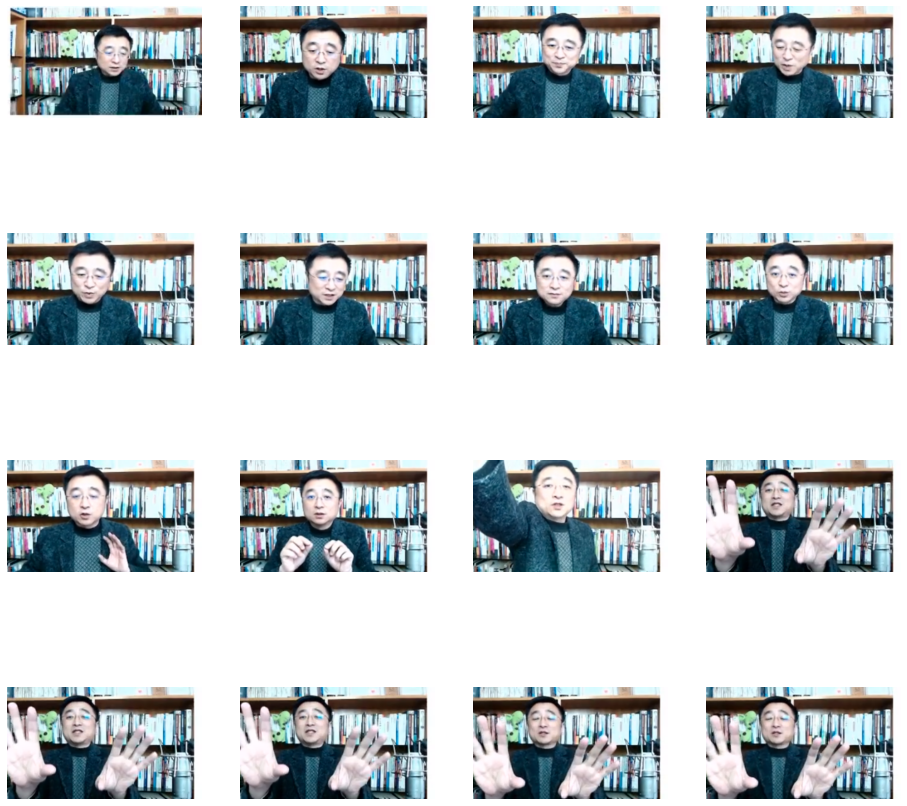

In [5]:
# Set up matplotlib fig, and size it to fit 4x4 pics
fig = plt.gcf()
fig.set_size_inches(ncols * 4, nrows * 4)

pic_index += 8
next_unenthusiastic_pix = [os.path.join(train_unenthusiastic_dir, fname) 
                for fname in train_unenthusiastic_fnames[pic_index-8:pic_index]]
next_enthusiastic_pix = [os.path.join(train_enthusiastic_dir, fname) 
                for fname in train_enthusiastic_fnames[pic_index-8:pic_index]]

for i, img_path in enumerate(next_unenthusiastic_pix+next_enthusiastic_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

In [6]:
from tensorflow.keras import layers
from tensorflow.keras import Model

# Our input feature map is 231X231x3: 231X231 for the image pixels, and 3 for
# the three color channels: R, G, and B
img_input = layers.Input(shape=(231, 231, 3))

# First convolution extracts 16 filters that are 3x3
# Convolution is followed by max-pooling layer with a 2x2 window
x = layers.Conv2D(16, 3, activation='relu')(img_input)
x = layers.MaxPooling2D(2)(x)

# Second convolution extracts 32 filters that are 3x3
# Convolution is followed by max-pooling layer with a 2x2 window
x = layers.Conv2D(32, 3, activation='relu')(x)
x = layers.MaxPooling2D(2)(x)

# Third convolution extracts 64 filters that are 3x3
# Convolution is followed by max-pooling layer with a 2x2 window
x = layers.Conv2D(64, 3, activation='relu')(x)
x = layers.MaxPooling2D(2)(x)


In [7]:
# Flatten feature map to a 1-dim tensor so we can add fully connected layers
x = layers.Flatten()(x)

# Create a fully connected layer with ReLU activation and 512 hidden units
x = layers.Dense(512, activation='relu')(x)

# Create output layer with a single node and sigmoid activation
output = layers.Dense(1, activation='sigmoid')(x)

# Create model:
# input = input feature map
# output = input feature map + stacked convolution/maxpooling layers + fully 
# connected layer + sigmoid output layer
model = Model(img_input, output)

In [8]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 231, 231, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 229, 229, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 114, 114, 16)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 112, 112, 32)      4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 56, 56, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 54, 54, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 27, 27, 64)        0     

In [9]:
from tensorflow.keras.optimizers import RMSprop

model.compile(loss='binary_crossentropy',
              optimizer=RMSprop(lr=0.001),
              metrics=['acc'])

In [10]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# All images will be rescaled by 1./255
train_datagen = ImageDataGenerator(rescale=1./255)

# Flow training images in batches of 20 using train_datagen generator
train_generator = train_datagen.flow_from_directory(
        train_dir,  # This is the source directory for training images
        target_size=(231, 231),  # All images will be resized to 333X333
        classes= ['unenthusiastic', 'enthusiastic'],    #defult: 0为前者, 1会后者
        batch_size=33,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

Found 665 images belonging to 2 classes.


In [11]:
train_labels = train_generator.classes 
train_labels

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [12]:
history = model.fit_generator(
      train_generator,
      steps_per_epoch=21,  # 665 images = batch_size * steps
      epochs=4,
      verbose=2)

Instructions for updating:
Please use Model.fit, which supports generators.
  ...
    to  
  ['...']
Train for 21 steps
Epoch 1/4
21/21 - 93s - loss: 1.2803 - acc: 0.7173
Epoch 2/4
21/21 - 87s - loss: 0.2550 - acc: 0.8992
Epoch 3/4
21/21 - 81s - loss: 0.1093 - acc: 0.9579
Epoch 4/4
21/21 - 72s - loss: 0.0997 - acc: 0.9639


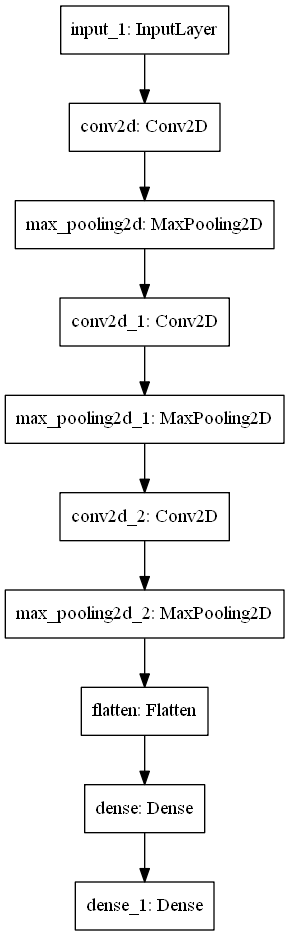

In [13]:
from tensorflow.keras.utils import plot_model
import pydot_ng as pydot

plot_model(model, to_file='model.png')

C:\Users\user\Anaconda3\lib\site-packages\ipykernel_launcher.py:43: RuntimeWarning: invalid value encountered in true_divide


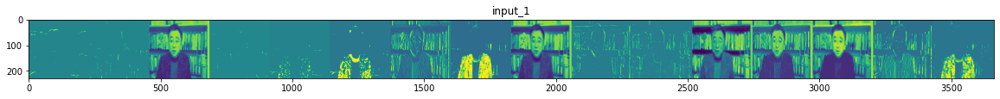

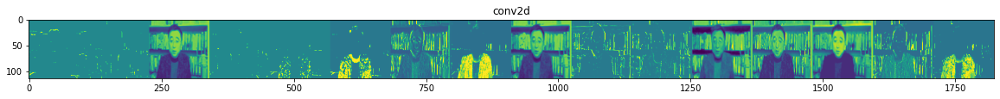

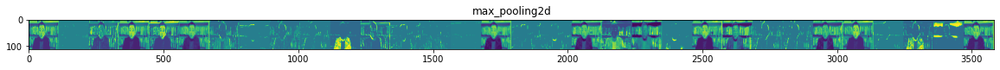

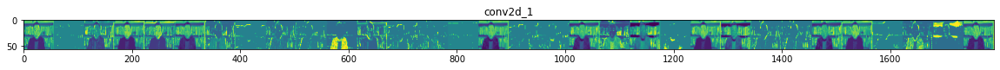

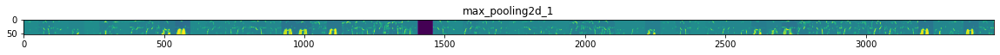

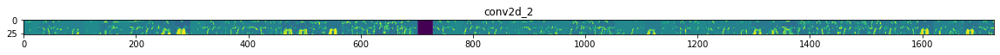

In [14]:
import numpy as np
import random
from tensorflow.keras.preprocessing.image import img_to_array, load_img

# Let's define a new Model that will take an image as input, and will output
# intermediate representations for all layers in the previous model after
# the first.
successive_outputs = [layer.output for layer in model.layers[1:]]
visualization_model = Model(img_input, successive_outputs)

# Let's prepare a random input image of a unenthusiastic or ununenthusiastic from the training set.
unenthusiastic_img_files = [os.path.join(train_unenthusiastic_dir, f) for f in train_unenthusiastic_fnames]
enthusiastic_img_files = [os.path.join(train_enthusiastic_dir, f) for f in train_enthusiastic_fnames]
img_path = random.choice(unenthusiastic_img_files + unenthusiastic_img_files)

img = load_img(img_path, target_size=(231, 231))  # this is a PIL image
x = img_to_array(img)  # Numpy array with shape (231, 231, 3)
x = x.reshape((1,) + x.shape)  # Numpy array with shape (1, 231, 231, 3)

# Rescale by 1/255
x /= 255

# Let's run our image through our network, thus obtaining all
# intermediate representations for this image.
successive_feature_maps = visualization_model.predict(x)

# These are the names of the layers, so can have them as part of our plot
layer_names = [layer.name for layer in model.layers]

# Now let's display our representations
for layer_name, feature_map in zip(layer_names, successive_feature_maps):
  if len(feature_map.shape) == 4:
    # Just do this for the conv / maxpool layers, not the fully-connected layers
    n_features = feature_map.shape[-1]  # number of features in feature map
    # The feature map has shape (1, size, size, n_features)
    size = feature_map.shape[1]
    # We will tile our images in this matrix
    display_grid = np.zeros((size, size * n_features))
    for i in range(n_features):
      # Postprocess the feature to make it visually palatable
      x = feature_map[0, :, :, i]
      x -= x.mean()
      x /= x.std()
      x *= 64
      x += 128
      x = np.clip(x, 0, 255).astype('uint8')
      # We'll tile each filter into this big horizontal grid
      display_grid[:, i * size : (i + 1) * size] = x
    # Display the grid
    scale = 20. / n_features
    plt.figure(figsize=(scale * n_features, scale))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

Text(0.5, 1.0, 'Training loss')

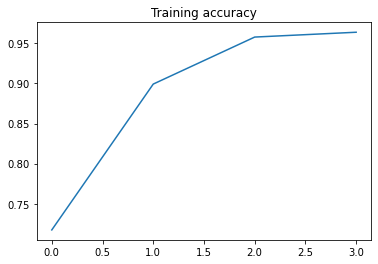

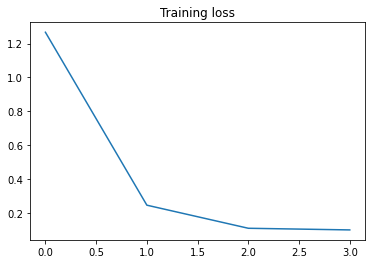

In [15]:
# Retrieve a list of accuracy results on training and validation data
# sets for each training epoch
acc = history.history['acc']

# Retrieve a list of list results on training and validation data
# sets for each training epoch
loss = history.history['loss']

# Get number of epochs
epochs = range(len(acc))

# Plot training and validation accuracy per epoch
plt.plot(epochs, acc)
plt.title('Training accuracy')

plt.figure()

# Plot training and validation loss per epoch
plt.plot(epochs, loss)
plt.title('Training loss')

In [16]:
import os


test_dir = os.path.join(base_dir, 'test_dataset')

test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(231, 231),
        batch_size=33,
        class_mode='binary',
        shuffle=False)    #it is important to specify shuffle=False in order to preserve 
                            #the order of filenames and predictions.

pred=model.predict_generator(test_generator, steps=len(test_generator), verbose=1)


# Get classes by np.round
cl = np.round(pred)
# Get filenames (set shuffle=false in generator is important)
filenames=test_generator.filenames

# Data frame
results=pd.DataFrame({"file":filenames,"pr":pred[:,0], "class":cl[:,0]})



Found 665 images belonging to 1 classes.
Instructions for updating:
Please use Model.predict, which supports generators.
21/21 [==============================] - 33s 2s/step


In [17]:
pd.set_option('display.max_columns', 22)
pd.set_option('display.max_rows', 252)

results

,file,pr,class
0,test\test_dataset (1).png,0.000034,0.0
1,test\test_dataset (10).png,0.000049,0.0
2,test\test_dataset (100).png,0.991028,1.0
3,test\test_dataset (101).png,0.989468,1.0
4,test\test_dataset (102).png,0.989468,1.0
...,...,...,...
660,test\test_dataset (95).png,0.998435,1.0
661,test\test_dataset (96).png,0.998435,1.0
662,test\test_dataset (97).png,0.996243,1.0
663,test\test_dataset (98).png,0.996243,1.0


In [18]:
len(results.loc[results['class'] == 1.0])

320

In [19]:
len(results.loc[results['class'] == 0])

345

In [20]:
import numpy as np
import skimage

unen_img = []
for i in range(344):
    img_path = os.path.join(train_unenthusiastic_dir, 'unenthusiastic'+' ({0})'.format(i+1)+'.png')
    img = load_img(img_path, target_size=(231, 231))
    x = img_to_array(img)
    x = x.reshape((1,) + x.shape)
    x /= 255
    unen_img.append(x)

len(unen_img)

344

In [21]:
prob_of_en_on_unenIMG = []
for i in range(344):
    a = model.predict(unen_img[i])
    a = a.flatten()
    a = a.tolist()
    prob_of_en_on_unenIMG.append(a)

prob_of_en_on_unenIMG
#You have predicted class probabilities. Since you are doing binary classification. 
#You have a dense layer consisting of one unit with an activation function of the sigmoid. 
#Sigmoid function outputs a value in the range [0,1] which corresponds to 
# the probability of the given sample belonging to a positive class (i.e. class one).

#通过train_labels = train_generator.classes 查询, 
#我们知道"enthusiastic"是1 (positive class), "unenthusiastic"是0 (negative class). 

[[4.8899546527536586e-05],
 [0.0077728391624987125],
 [0.006814240477979183],
 [0.0059813219122588634],
 [0.0068570333532989025],
 [0.0033587676007300615],
 [0.006272217724472284],
 [0.005059386137872934],
 [0.0025358928833156824],
 [0.0028704542201012373],
 [0.003195402445271611],
 [0.0028588820714503527],
 [0.002972003072500229],
 [0.005203408654779196],
 [0.00919819064438343],
 [0.006935711018741131],
 [0.019711535423994064],
 [0.022279895842075348],
 [0.006130068562924862],
 [0.02568802423775196],
 [0.0264210794121027],
 [0.013904973864555359],
 [0.0076397983357310295],
 [0.01549016684293747],
 [0.005299747455865145],
 [0.007467404939234257],
 [0.006094742100685835],
 [0.0042051104828715324],
 [0.0031258973758667707],
 [0.007974101230502129],
 [0.006033039186149836],
 [0.0029256190173327923],
 [0.01891685649752617],
 [0.05751876160502434],
 [0.12610694766044617],
 [0.019229842349886894],
 [0.007602386642247438],
 [0.028198406100273132],
 [0.0067572519183158875],
 [0.051606755703687

In [22]:
en_img = []
for i in range(321):
    img_path = os.path.join(train_enthusiastic_dir, 'enthusiastic'+' ({0})'.format(i+1)+'.png')
    img = load_img(img_path, target_size=(231, 231))
    x = img_to_array(img)
    x = x.reshape((1,) + x.shape)
    x /= 255
    en_img.append(x)

len(en_img)

321

In [23]:
prob_of_en_on_enIMG = []
for i in range(321):
    b = model.predict(en_img[i])
    b = b.flatten()
    b = b.tolist()
    prob_of_en_on_enIMG.append(b)

prob_of_en_on_enIMG

[[0.999813973903656],
 [0.9975870847702026],
 [0.8847481608390808],
 [0.9426828026771545],
 [0.9985016584396362],
 [0.9999886751174927],
 [0.9969193935394287],
 [0.994272768497467],
 [0.9999961853027344],
 [0.9999961853027344],
 [0.9999982118606567],
 [0.9999982118606567],
 [0.9719192981719971],
 [0.9999430179595947],
 [0.9999430179595947],
 [0.9999430179595947],
 [0.999886155128479],
 [0.999886155128479],
 [0.9989535808563232],
 [0.9989535808563232],
 [0.9999430179595947],
 [0.9971402883529663],
 [0.9999775886535645],
 [0.8734638690948486],
 [0.8515356779098511],
 [0.8515356779098511],
 [0.9999861717224121],
 [0.9999861717224121],
 [0.9999861717224121],
 [0.9998785257339478],
 [0.9998785257339478],
 [0.9999861717224121],
 [0.9999740123748779],
 [0.9999740123748779],
 [0.9999932050704956],
 [0.9999932050704956],
 [0.9999932050704956],
 [0.9999932050704956],
 [0.8290253281593323],
 [0.8290253281593323],
 [0.9997735619544983],
 [0.9997735619544983],
 [0.9997735619544983],
 [0.99977356195

In [24]:
unen_img_squeeze = []

for i in range(344):
    c = np.squeeze(unen_img[i], axis=0)
    unen_img_squeeze.append(c)

unen_img_squeeze

[array([[[0.99215686, 1.        , 1.        ],
         [0.972549  , 0.9882353 , 1.        ],
         [0.99215686, 0.9843137 , 1.        ],
         ...,
         [0.99607843, 0.9882353 , 0.99607843],
         [0.99607843, 0.9882353 , 0.99607843],
         [0.99607843, 0.9882353 , 0.99607843]],
 
        [[0.9882353 , 0.99607843, 1.        ],
         [0.9843137 , 1.        , 1.        ],
         [0.99607843, 0.9882353 , 1.        ],
         ...,
         [0.99215686, 0.9882353 , 0.99607843],
         [0.99215686, 0.9882353 , 0.99607843],
         [0.99215686, 0.9882353 , 0.99607843]],
 
        [[0.99215686, 1.        , 1.        ],
         [0.99215686, 1.        , 1.        ],
         [0.99607843, 0.99215686, 1.        ],
         ...,
         [0.9764706 , 0.9882353 , 0.99607843],
         [0.9764706 , 0.9882353 , 0.99607843],
         [0.9764706 , 0.9882353 , 0.99607843]],
 
        ...,
 
        [[1.        , 0.99607843, 1.        ],
         [1.        , 0.99607843, 1.     

In [25]:
en_img_squeeze = []

for i in range(321):
    d = np.squeeze(en_img[i], axis=0)
    en_img_squeeze.append(d)

en_img_squeeze

[array([[[0.6627451 , 0.827451  , 0.8784314 ],
         [0.45490196, 0.64705884, 0.7254902 ],
         [0.43137255, 0.64705884, 0.7372549 ],
         ...,
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ]],
 
        [[0.654902  , 0.8156863 , 0.8666667 ],
         [0.45490196, 0.6431373 , 0.7254902 ],
         [0.43137255, 0.64705884, 0.7372549 ],
         ...,
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ]],
 
        [[0.64705884, 0.80784315, 0.85882354],
         [0.4509804 , 0.6431373 , 0.72156864],
         [0.43137255, 0.64705884, 0.7372549 ],
         ...,
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ]],
 
        ...,
 
        [[0.8       , 0.8627451 , 0.8901961 ],
         [0.40392157, 0.43529412, 0.46274

In [26]:
# why do we need np.squeeze()?
# https://stackoverflow.com/questions/34990652/why-do-we-need-np-squeeze
# x = np.ones((2, 1))*2
# z = np.ones((2,))*3
# print(x)
# print(z)

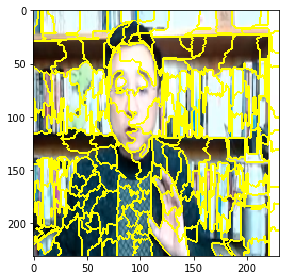

In [27]:
#Generate segmentation for image
import skimage.segmentation
import skimage.io
superpixels = skimage.segmentation.quickshift(en_img_squeeze[0], kernel_size=2, max_dist=100, ratio=0.5)
num_superpixels = np.unique(superpixels).shape[0]
skimage.io.imshow(skimage.segmentation.mark_boundaries(en_img_squeeze[0], superpixels))


In [28]:
superpixels.shape

(231, 231)

In [29]:
num_superpixels

154

In [30]:
#Generate perturbations
num_perturb = 665
perturbations = np.random.binomial(1, 0.5, size=(num_perturb, num_superpixels))  
# Why not choose one of num_superpixels for 154 times? 
perturbations.shape

(665, 154)

[0 0 0 1 1 0 1 0 1 1 0 1 0 1 0 1 0 0 1 0 1 0 0 0 1 1 1 1 0 0 0 0 1 0 0 1 0
 1 0 1 0 0 1 1 0 0 0 0 1 1 1 0 0 1 0 0 1 1 0 0 1 0 0 1 1 1 1 0 1 1 0 1 0 0
 1 0 1 1 0 0 1 1 1 1 0 1 0 1 1 1 0 1 0 1 0 0 0 1 0 1 0 1 0 0 1 1 1 1 0 0 1
 1 1 1 0 0 1 0 1 0 0 1 1 0 0 0 1 0 0 0 0 0 0 1 1 1 0 0 0 1 1 0 1 1 0 0 1 1
 0 0 1 0 0 0]


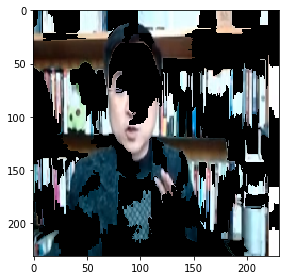

In [31]:
#Create function to apply perturbations to images
import copy
def perturb_image(img,perturbation,segments): 
  active_pixels = np.where(perturbation == 1)[0]
  mask = np.zeros(segments.shape)
  for active in active_pixels:
      mask[segments == active] = 1 
  perturbed_image = copy.deepcopy(img)
  perturbed_image = perturbed_image*mask[:,:,np.newaxis]
  return perturbed_image

#Show example of perturbations
print(perturbations[0]) 
skimage.io.imshow(perturb_image(en_img_squeeze[0],perturbations[0],superpixels))

In [32]:
predictions = []
for pert in perturbations:
  perturbed_img = perturb_image(en_img_squeeze[0],pert,superpixels)
  pred = model.predict(perturbed_img[np.newaxis,:,:,:])
  predictions.append(pred)

predictions = np.array(predictions)
predictions

array([[[0.9999863 ]],

       [[1.        ]],

       [[1.        ]],

       [[1.        ]],

       [[1.        ]],

       [[0.99999964]],

       [[1.        ]],

       [[1.        ]],

       [[1.        ]],

       [[1.        ]],

       [[1.        ]],

       [[0.9999981 ]],

       [[1.        ]],

       [[1.        ]],

       [[1.        ]],

       [[1.        ]],

       [[1.        ]],

       [[1.        ]],

       [[1.        ]],

       [[1.        ]],

       [[1.        ]],

       [[1.        ]],

       [[1.        ]],

       [[1.        ]],

       [[1.        ]],

       [[1.        ]],

       [[0.9999999 ]],

       [[1.        ]],

       [[0.999995  ]],

       [[1.        ]],

       [[1.        ]],

       [[1.        ]],

       [[1.        ]],

       [[0.9999987 ]],

       [[0.99999976]],

       [[1.        ]],

       [[1.        ]],

       [[1.        ]],

       [[0.9999982 ]],

       [[0.9999999 ]],

       [[0.99999917]],

       [[1.     

In [33]:
print(predictions.shape)

(665, 1, 1)


In [34]:
#Compute distances to original image
import sklearn.metrics
original_image = np.ones(num_superpixels)[np.newaxis,:] #Perturbation with all superpixels enabled 
distances = sklearn.metrics.pairwise_distances(perturbations,original_image, metric='cosine').ravel()
print(distances.shape)

#Transform distances to a value between 0 an 1 (weights) using a kernel function
kernel_width = 0.25
weights = np.sqrt(np.exp(-(distances**2)/kernel_width**2)) #Kernel function
print(weights.shape)

(665,)
(665,)


In [35]:
predictions_sq = np.squeeze(predictions, axis=1)

In [36]:
predictions_sq = np.squeeze(predictions_sq, axis=1)

In [37]:
#Estimate linear model
from sklearn.linear_model import LinearRegression
simpler_model = LinearRegression().fit(X=perturbations, y=predictions_sq, sample_weight=weights)
coeff = simpler_model.coef_

In [38]:
coeff.shape

(154,)

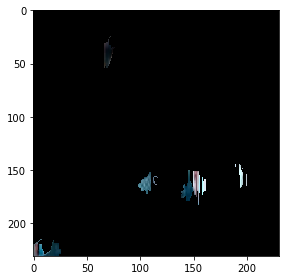

In [39]:
#Use coefficients from linear model to extract top features
num_top_features = 5
top_features = np.argsort(coeff)[-5:] #10 = num_top_features

#Show only the superpixels corresponding to the top features
mask = np.zeros(num_superpixels) 
mask[top_features]= True #Activate top superpixels
skimage.io.imshow(perturb_image(en_img_squeeze[0],mask,superpixels))

In [40]:
def perturb_image2(mask, segments): 
  active_pixels = top_features
  mask = np.zeros(segments.shape)
  for active in active_pixels:
      mask[segments == active] = 1 
  return mask

C = perturb_image2(mask, superpixels)
D = np.int64(C)
D

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0]], dtype=int64)

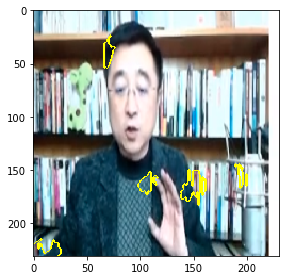

In [41]:
skimage.io.imshow(skimage.segmentation.mark_boundaries(en_img_squeeze[0], D))

In [42]:
# use LIME package 

from lime import lime_image
import time

In [43]:
explainer = lime_image.LimeImageExplainer()

In [44]:
explanation = explainer.explain_instance(en_img_squeeze[0], model, hide_color=0)

In [45]:
tmp = time.time()
print(time.time() - tmp)

0.0


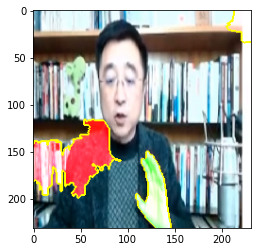

In [46]:
from skimage.segmentation import mark_boundaries
temp, mask = explanation.get_image_and_mask(0, positive_only=False, num_features=5, hide_rest=False)
plt.imshow(mark_boundaries(temp, mask))

In [47]:
en_img_squeeze[0].shape #直接餵給inceptionV3_model.predict需要(batch_size, 299, 299, 3) = Xi[np.newaxis,:,:,:]
                        #餵給explainer.explain_instance只需(299, 299, 3) = Xi (非0-1 or 0-255)

(231, 231, 3)

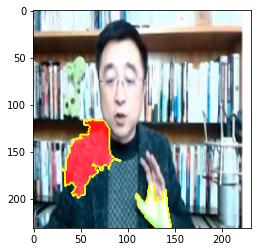

In [48]:
from skimage.segmentation import mark_boundaries
temp, mask = explanation.get_image_and_mask(0, positive_only=False, num_features=2, hide_rest=False)
plt.imshow(mark_boundaries(temp, mask))

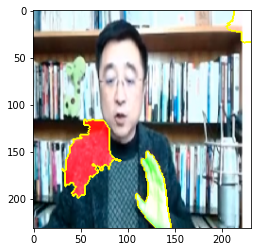

In [49]:
from skimage.segmentation import mark_boundaries
temp, mask = explanation.get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(temp, mask))

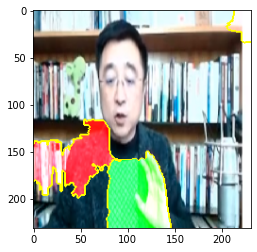

In [50]:
from skimage.segmentation import mark_boundaries
temp, mask = explanation.get_image_and_mask(0, positive_only=False, num_features=6, hide_rest=False)
plt.imshow(mark_boundaries(temp, mask))

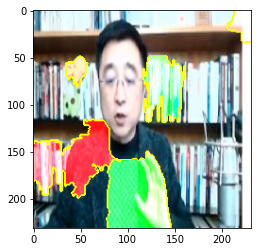

In [51]:
from skimage.segmentation import mark_boundaries
temp, mask = explanation.get_image_and_mask(0, positive_only=False, num_features=8, hide_rest=False)
plt.imshow(mark_boundaries(temp, mask))

In [52]:
prob_of_en_on_enIMG_F = [val for sublist in prob_of_en_on_enIMG for val in sublist] # for flattening

top_50_idx = np.argsort(prob_of_en_on_enIMG_F)[-50:]
top_50_values = [prob_of_en_on_enIMG_F[i] for i in top_50_idx]

print(top_50_idx)
print(top_50_values)


[ 34  35 290 136 135 139  52  53  54  61 140 236 141 142 137 138   8   9
 244 253 233 218 219 245 238 230 234 232 220 235 226  11  10 227  50  51
 223 239 225 243 237 222 221 275 307 274 268 271 272 273]
[0.9999932050704956, 0.9999932050704956, 0.9999938011169434, 0.9999945163726807, 0.9999945163726807, 0.9999947547912598, 0.9999947547912598, 0.9999947547912598, 0.9999947547912598, 0.9999947547912598, 0.9999947547912598, 0.9999949932098389, 0.999995231628418, 0.999995231628418, 0.9999954700469971, 0.9999954700469971, 0.9999961853027344, 0.9999961853027344, 0.999996542930603, 0.9999970197677612, 0.9999971389770508, 0.9999971389770508, 0.9999971389770508, 0.9999972581863403, 0.9999973773956299, 0.9999977350234985, 0.9999977350234985, 0.9999979734420776, 0.9999980926513672, 0.9999980926513672, 0.9999982118606567, 0.9999982118606567, 0.9999982118606567, 0.9999982118606567, 0.9999983310699463, 0.9999983310699463, 0.9999986886978149, 0.9999986886978149, 0.9999988079071045, 0.9999988079071045

In [53]:
a_dictionary = {}

for i in top_50_idx:
    a_dictionary['explanation%s' %i] = explainer.explain_instance(en_img_squeeze[i], model, hide_color=0)


In [115]:
from skimage.segmentation import mark_boundaries
dic_temp = {}
dic_mask = {}

for i in top_50_idx: 
    dic_temp['temp%s' %i], dic_mask['mask%s' %i] = a_dictionary['explanation' + str(i)].get_image_and_mask(0, positive_only=False, num_features=2, hide_rest=False)


In [56]:
# 34  35 290 136 135 139  52  53  54  61 140 236 141 142 137 138   8   9
# 244 253 233 218 219 245 238 230 234 232 220 235 226  11  10 227  50  51
# 223 239 225 243 237 222 221 275 307 274 268 271 272 273

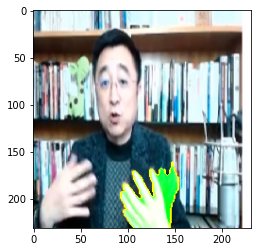

In [116]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation34'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp34'], dic_mask['mask34']))

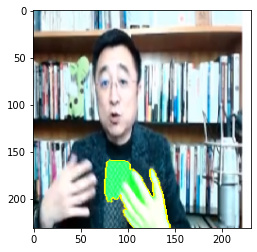

In [117]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation35'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp35'], dic_mask['mask35']))

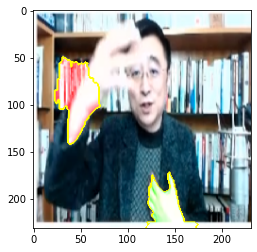

In [118]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation290'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp290'], dic_mask['mask290']))

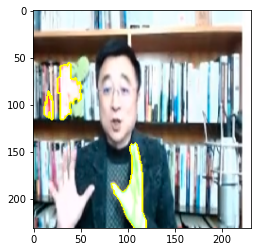

In [119]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation136'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp136'], dic_mask['mask136']))

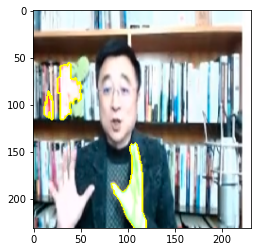

In [120]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation135'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp135'], dic_mask['mask135']))

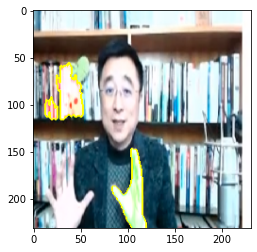

In [121]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation139'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp139'], dic_mask['mask139']))

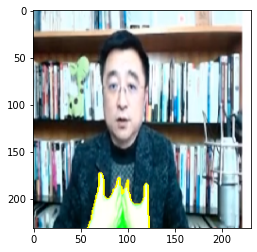

In [122]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation52'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp52'], dic_mask['mask52']))

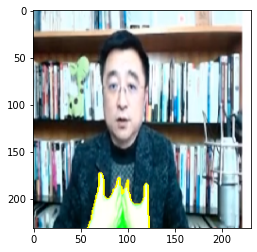

In [123]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation53'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp53'], dic_mask['mask53']))

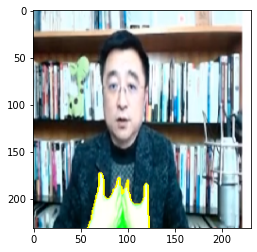

In [124]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation54'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp54'], dic_mask['mask54']))

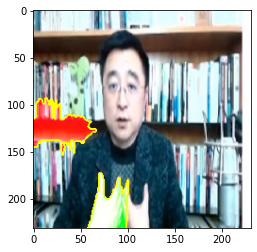

In [125]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation61'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp61'], dic_mask['mask61']))

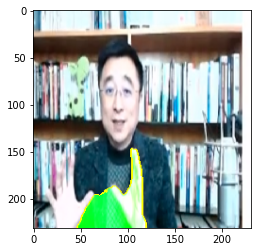

In [126]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation140'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp140'], dic_mask['mask140']))

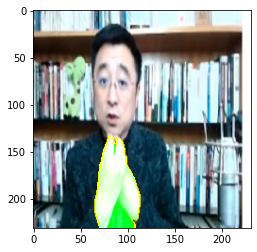

In [127]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation236'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp236'], dic_mask['mask236']))

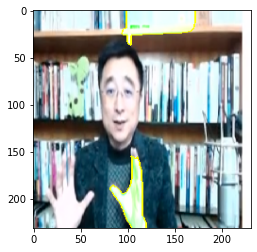

In [128]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation141'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp141'], dic_mask['mask141']))

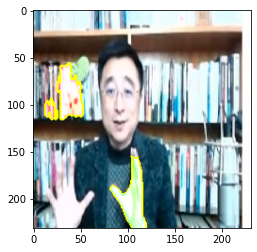

In [129]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation142'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp142'], dic_mask['mask142']))

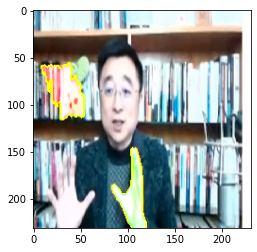

In [130]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation137'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp137'], dic_mask['mask137']))

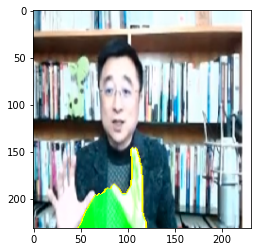

In [131]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation138'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp138'], dic_mask['mask138']))

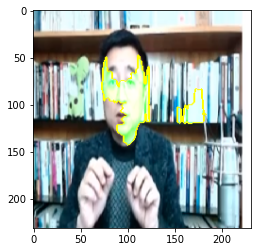

In [132]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation8'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp8'], dic_mask['mask8']))

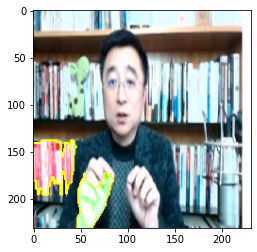

In [133]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation9'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp9'], dic_mask['mask9']))

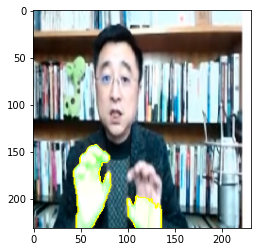

In [134]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation244'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp244'], dic_mask['mask244']))

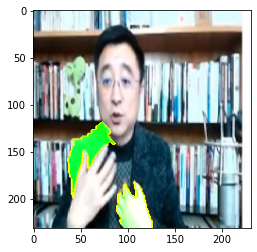

In [135]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation253'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp253'], dic_mask['mask253']))

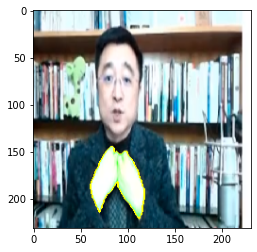

In [136]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation233'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp233'], dic_mask['mask233']))

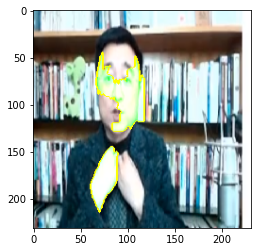

In [137]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation218'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp218'], dic_mask['mask218']))

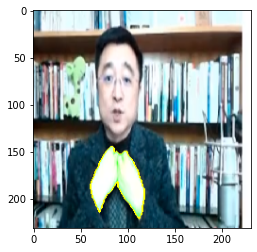

In [138]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation219'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp219'], dic_mask['mask219']))

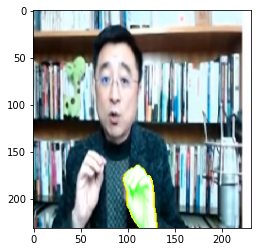

In [139]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation245'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp245'], dic_mask['mask245']))

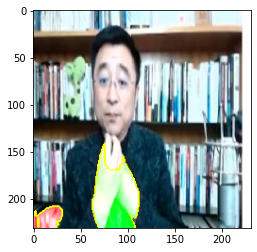

In [140]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation238'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp238'], dic_mask['mask238']))

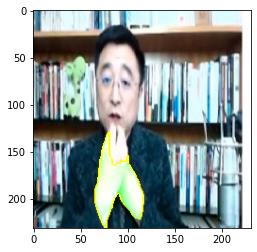

In [141]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation230'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp230'], dic_mask['mask230']))

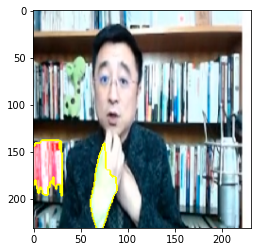

In [142]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation234'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp234'], dic_mask['mask234']))

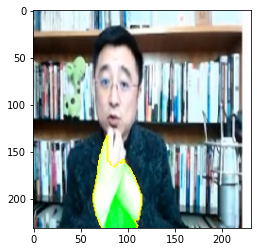

In [143]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation232'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp232'], dic_mask['mask232']))

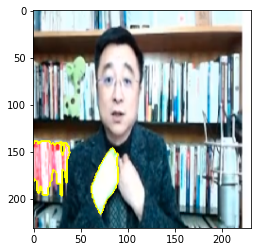

In [144]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation220'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp220'], dic_mask['mask220']))

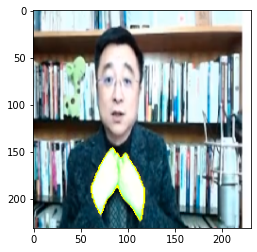

In [145]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation235'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp235'], dic_mask['mask235']))

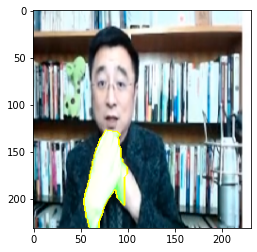

In [146]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation226'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp226'], dic_mask['mask226']))

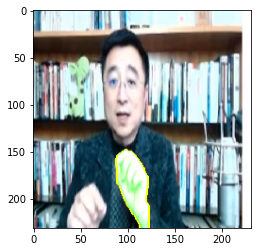

In [147]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation11'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp11'], dic_mask['mask11']))

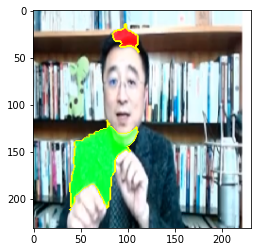

In [148]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation10'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp10'], dic_mask['mask10']))

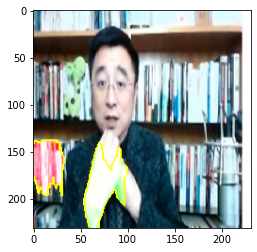

In [149]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation227'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp227'], dic_mask['mask227']))

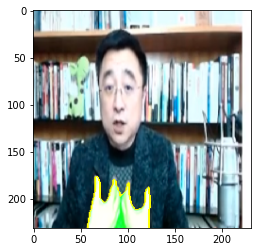

In [150]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation50'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp50'], dic_mask['mask50']))

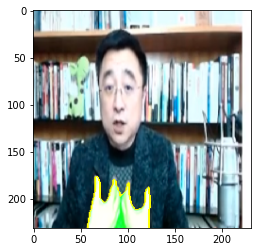

In [151]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation51'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp51'], dic_mask['mask51']))

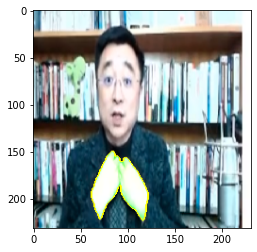

In [152]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation223'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp223'], dic_mask['mask223']))

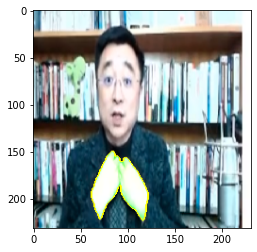

In [153]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation239'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp239'], dic_mask['mask239']))

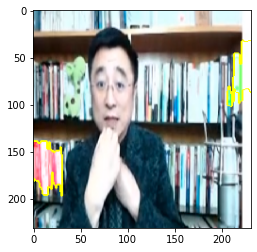

In [154]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation225'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp225'], dic_mask['mask225']))

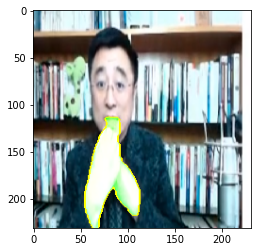

In [155]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation243'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp243'], dic_mask['mask243']))

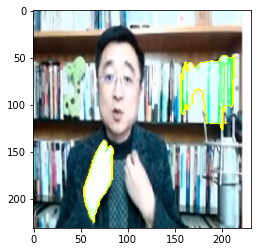

In [156]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation237'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp237'], dic_mask['mask237']))

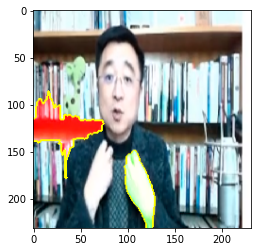

In [157]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation222'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp222'], dic_mask['mask222']))

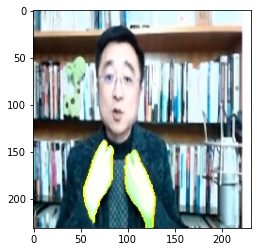

In [158]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation221'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp221'], dic_mask['mask221']))

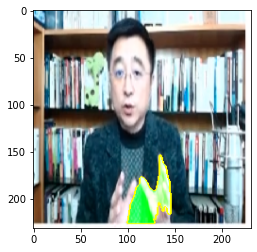

In [159]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation275'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp275'], dic_mask['mask275']))

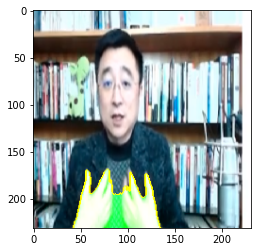

In [160]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation307'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp307'], dic_mask['mask307']))

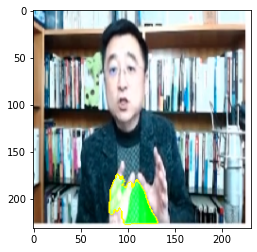

In [161]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation274'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp274'], dic_mask['mask274']))

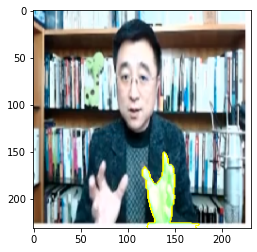

In [162]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation268'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp268'], dic_mask['mask268']))

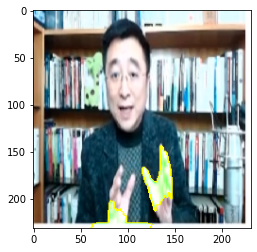

In [163]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation271'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp271'], dic_mask['mask271']))

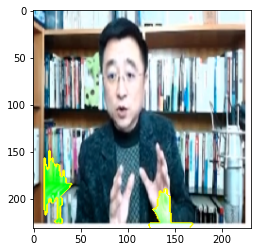

In [164]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation272'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp272'], dic_mask['mask272']))

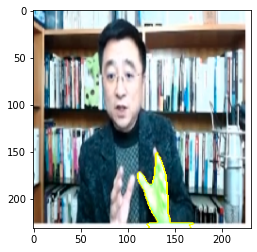

In [165]:
from skimage.segmentation import mark_boundaries
temp, mask = a_dictionary['explanation273'].get_image_and_mask(0, positive_only=False, num_features=4, hide_rest=False)
plt.imshow(mark_boundaries(dic_temp['temp273'], dic_mask['mask273']))